In [1]:
from tensorflow import keras
from tensorflow.keras import layers

import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import imageio

In [2]:
!pip install -q git+https://github.com/tensorflow/docs
from tensorflow_docs.vis import embed

In [8]:
batch_size = 100
num_channels = 3
num_classes = 5
image_size = 128
latent_dim = 128

dataset_path = 'example-dataset'
img_size = (image_size, image_size)
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(      
        rescale=1/255.)

train_generator = train_datagen.flow_from_directory(
        dataset_path,
        target_size=img_size,
        batch_size=batch_size,
        class_mode='categorical')

total_size = train_generator.samples

Found 1708 images belonging to 5 classes.


In [34]:
batch_size = 100
num_channels = 3
num_classes = 8
image_size = 128
latent_dim = 128

dataset_path = 'artemis-dataset'
img_size = (image_size, image_size)
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
        rescale=1/255.)

train_generator = train_datagen.flow_from_directory(
        dataset_path,
        target_size=img_size,
        batch_size=batch_size,
        class_mode='categorical')


total_size = train_generator.samples

Found 32420 images belonging to 8 classes.


In [35]:
labelDict = list(train_generator.class_indices.keys())

In [36]:
def Gen():
    gen = train_generator
    for (x,y) in gen:
        yield (x,y)
gen = Gen()

In [37]:
ds = tf.data.Dataset.from_generator(Gen,output_types=(tf.float32, tf.float32),output_shapes = ([None, 128, 128, 3], [None, num_classes]),)

In [38]:
it = iter(ds)
batch = next(it)

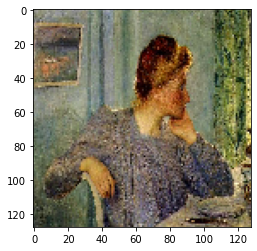

contentment


In [42]:
import random as rnd

ind = rnd.randint(0,99)

plt.imshow(batch[0][ind])
plt.show()
print(labelDict[tf.argmax(batch[1][ind], axis=0)])

In [ ]:
# Scale the pixel values to [0, 1] range, add a channel dimension to
# the images, and one-hot encode the labels.
all_images = x.astype("float32") / 255.0
all_labels = y

# Create tf.data.Dataset.
dataset = tf.data.Dataset.from_tensor_slices((all_images, all_labels))
dataset = dataset.shuffle(buffer_size=1024).batch(batch_size)

print(f"Shape of training images: {all_images.shape}")
print(f"Shape of training labels: {all_labels.shape}")

In [43]:
generator_in_channels = latent_dim + num_classes
discriminator_in_channels = num_channels + num_classes
print(generator_in_channels, discriminator_in_channels)

136 11


In [ ]:
def conv_block(
    x,
    filters,
    activation,
    kernel_size=(3, 3),
    strides=(1, 1),
    padding="same",
    use_bias=True,
    use_bn=False,
    use_dropout=False,
    drop_value=0.5,
):
    x = layers.Conv2D(
        filters, kernel_size, strides=strides, padding=padding, use_bias=use_bias
    )(x)
    if use_bn:
        x = layers.BatchNormalization()(x)
    x = activation(x)
    if use_dropout:
        x = layers.Dropout(drop_value)(x)
    return x


def upsample_block(
    x,
    filters,
    activation,
    kernel_size=(3, 3),
    strides=(1, 1),
    up_size=(2, 2),
    padding="same",
    use_bn=False,
    use_bias=True,
    use_dropout=False,
    drop_value=0.3,
):
    x = layers.UpSampling2D(up_size)(x)
    x = layers.Conv2D(
        filters, kernel_size, strides=strides, padding=padding, use_bias=use_bias
    )(x)

    if use_bn:
        x = layers.BatchNormalization()(x)

    if activation:
        x = activation(x)
    if use_dropout:
        x = layers.Dropout(drop_value)(x)
    return x



In [ ]:
def get_discriminator_model():
    img_input = layers.Input(shape=(image_size, image_size, discriminator_in_channels))
    # Zero pad the input to make the input images size to (32, 32, 1).
    x = layers.GaussianNoise(0.1)(img_input)
    x = conv_block(
        x,
        64,
        kernel_size=(5, 5),
        strides=(2, 2),
        use_bn=False,
        use_bias=True,
        activation=layers.LeakyReLU(0.2),
        use_dropout=False,
        drop_value=0.3,
    )
    x = conv_block(
        x,
        128,
        kernel_size=(5, 5),
        strides=(2, 2),
        use_bn=False,
        activation=layers.LeakyReLU(0.2),
        use_bias=True,
        use_dropout=True,
        drop_value=0.3,
    )
    x = conv_block(
        x,
        256,
        kernel_size=(5, 5),
        strides=(2, 2),
        use_bn=False,
        activation=layers.LeakyReLU(0.2),
        use_bias=True,
        use_dropout=True,
        drop_value=0.3,
    )
    x = conv_block(
        x,
        512,
        kernel_size=(5, 5),
        strides=(2, 2),
        use_bn=False,
        activation=layers.LeakyReLU(0.2),
        use_bias=True,
        use_dropout=False,
        drop_value=0.3,
    )

    x = conv_block(
        x,
        1024,
        kernel_size=(5, 5),
        strides=(2, 2),
        use_bn=False,
        activation=layers.LeakyReLU(0.2),
        use_bias=True,
        use_dropout=False,
        drop_value=0.3,
    )
    
    x = layers.Flatten()(x)
    x = layers.Dropout(0.2)(x)
    x = layers.Dense(1)(x)

    d_model = keras.models.Model(img_input, x, name="discriminator")
    return d_model

d_model = get_discriminator_model()
d_model.summary()


In [ ]:
def get_generator_model():
    noise = layers.Input(shape=(generator_in_channels,))
    x = layers.Dense(2 * 2 * generator_in_channels)(noise)
    x = layers.Reshape((2, 2, generator_in_channels))(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(0.2)(x)

    x = upsample_block(
        x,
        512,
        layers.LeakyReLU(0.2),
        strides=(2, 2),
        use_bias=False,
        use_bn=True,
        padding="same",
        use_dropout=False,
    )
    x = upsample_block(
        x,
        256,
        layers.LeakyReLU(0.2),
        strides=(2, 2),
        use_bias=False,
        use_bn=True,
        padding="same",
        use_dropout=False,
    )
    x = upsample_block(
        x,
        128,
        layers.LeakyReLU(0.2),
        strides=(2, 2),
        use_bias=False,
        use_bn=True,
        padding="same",
        use_dropout=False,
    )
    x = upsample_block(
        x,
        64,
        layers.LeakyReLU(0.2),
        strides=(2, 2),
        use_bias=False,
        use_bn=True,
        padding="same",
        use_dropout=False,
    )
    x = upsample_block(
        x, 3, layers.Activation("sigmoid"), strides=(2, 2), use_bias=False, use_bn=True
    )

    g_model = keras.models.Model(noise, x, name="generator")
    return g_model


g_model = get_generator_model()
g_model.summary()

In [ ]:
# OG DISC AND GEN
# Create the discriminator.
discriminator = keras.Sequential(
    [
        keras.layers.InputLayer((image_size, image_size, discriminator_in_channels)),
        layers.GaussianNoise(0.1),
     
        layers.Conv2D(64, (3, 3), strides=(2, 2), padding="same"),
        layers.BatchNormalization(momentum=0.9),
        layers.LeakyReLU(alpha=0.2),
     
        layers.Conv2D(128, (3, 3), strides=(2, 2), padding="same"),
        layers.BatchNormalization(momentum=0.9),
        layers.LeakyReLU(alpha=0.2),
     
        layers.Conv2D(256, (3, 3), strides=(2, 2), padding="same"),
        layers.BatchNormalization(momentum=0.9),
        layers.LeakyReLU(alpha=0.2),
     
        layers.Conv2D(512, (3, 3), strides=(2, 2), padding="same"),
        layers.BatchNormalization(momentum=0.9),
        layers.LeakyReLU(alpha=0.2),
        
        layers.Conv2D(1024, (3, 3), strides=(2, 2), padding="same"),
        layers.BatchNormalization(momentum=0.9),
        layers.LeakyReLU(alpha=0.2),

        layers.GlobalMaxPooling2D(),
     
        layers.Dense(1),
    ],
    name="discriminator",
)

# Create the generator.
generator = keras.Sequential(
    [
        keras.layers.InputLayer((generator_in_channels,)),
        # We want to generate 128 + num_classes coefficients to reshape into a
        # 7x7x(128 + num_classes) map.
        layers.Dense(2 * 2 * generator_in_channels),
    
        layers.Reshape((2, 2, generator_in_channels)),
        layers.BatchNormalization(momentum=0.9),
        layers.LeakyReLU(alpha=0.1),

        layers.Conv2DTranspose(512, (4, 4), strides=(2, 2), padding="same"),
        layers.BatchNormalization(momentum=0.9),
        layers.LeakyReLU(alpha=0.1),
        
        layers.Conv2DTranspose(256, (4, 4), strides=(2, 2), padding="same"),
        layers.BatchNormalization(momentum=0.9),
        layers.LeakyReLU(alpha=0.1),
     
        layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"),
        layers.BatchNormalization(momentum=0.9),
        layers.LeakyReLU(alpha=0.2),
     
        layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"),
        layers.BatchNormalization(momentum=0.9),
        layers.LeakyReLU(alpha=0.2),
     
        layers.Conv2DTranspose(3, (4, 4), strides=(2, 2), padding="same", activation="sigmoid"),
    ],
    name="generator",
)

In [9]:
# 128x128 DISC AND GEN BASED ON ACGAN PARAMS
# Create the discriminator.
discriminator = keras.Sequential(
    [
        keras.layers.InputLayer((image_size, image_size, discriminator_in_channels)),
        layers.GaussianNoise(0.1),
     
        layers.Conv2D(16, (3, 3), strides=(2, 2), padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.5),
     
        layers.Conv2D(32, (3, 3), strides=(1, 1), padding="same"),
        layers.BatchNormalization(),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.5),
        
        layers.Conv2D(64, (3, 3), strides=(2, 2), padding="same"),
        layers.BatchNormalization(),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.5),
     
        layers.Conv2D(128, (3, 3), strides=(1, 1), padding="same"),
        layers.BatchNormalization(),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.5),
     
        layers.Conv2D(256, (3, 3), strides=(2, 2), padding="same"),
        layers.BatchNormalization(),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.5),
        
        layers.Conv2D(512, (3, 3), strides=(1, 1), padding="same"),
        layers.BatchNormalization(),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.5),

        layers.GlobalMaxPooling2D(),
     
        layers.Dense(1),
    ],
    name="discriminator",
)

# Create the generator.
generator = keras.Sequential(
    [
        keras.layers.InputLayer((generator_in_channels,)),
        # We want to generate 128 + num_classes coefficients to reshape into a
        # 8x8x(128 + num_classes) map.
        layers.Dense(8 * 8 * generator_in_channels),
    
        layers.Reshape((8, 8, generator_in_channels)),
        
        layers.Conv2DTranspose(384, (5, 5), strides=(2, 2), padding="same"),
        layers.BatchNormalization(),
        layers.ReLU(),
        
        layers.Conv2DTranspose(256, (5, 5), strides=(2, 2), padding="same"),
        layers.BatchNormalization(),
        layers.ReLU(),
     
        layers.Conv2DTranspose(192, (5, 5), strides=(2, 2), padding="same"),
        layers.BatchNormalization(),
        layers.ReLU(),
     
        layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding="same", activation="sigmoid"),
    ],
    name="generator",
)

In [10]:
class ConditionalGAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super(ConditionalGAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim
        self.gen_loss_tracker = keras.metrics.Mean(name="generator_loss")
        self.disc_loss_tracker = keras.metrics.Mean(name="discriminator_loss")

    @property
    def metrics(self):
        return [self.gen_loss_tracker, self.disc_loss_tracker]

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super(ConditionalGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn

    def train_step(self, data):
        # Unpack the data.
        real_images, one_hot_labels = data

        # Add dummy dimensions to the labels so that they can be concatenated with
        # the images. This is for the discriminator.
        image_one_hot_labels = one_hot_labels[:, :, None, None]
        image_one_hot_labels = tf.repeat(
            image_one_hot_labels, repeats=[image_size * image_size]
        )
        image_one_hot_labels = tf.reshape(
            image_one_hot_labels, (-1, image_size, image_size, num_classes)
        )

        # Sample random points in the latent space and concatenate the labels.
        # This is for the generator.
        batch_size = tf.shape(real_images)[0]
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))
        random_vector_labels = tf.concat(
            [random_latent_vectors, one_hot_labels], axis=1
        )

        # Decode the noise (guided by labels) to fake images.
        generated_images = self.generator(random_vector_labels)

        # Combine them with real images. Note that we are concatenating the labels
        # with these images here.
        fake_image_and_labels = tf.concat([generated_images, image_one_hot_labels], -1)
        real_image_and_labels = tf.concat([real_images, image_one_hot_labels], -1)
        combined_images = tf.concat(
            [fake_image_and_labels, real_image_and_labels], axis=0
        )

        # Assemble labels discriminating real from fake images.
        labels = tf.concat(
            [tf.ones((batch_size, 1)), tf.zeros((batch_size, 1))], axis=0
        )

        # Train the discriminator.
        with tf.GradientTape() as tape:
            predictions = self.discriminator(combined_images)
            d_loss = self.loss_fn(labels, predictions)
        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(
            zip(grads, self.discriminator.trainable_weights)
        )

        # Sample random points in the latent space.
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))
        random_vector_labels = tf.concat(
            [random_latent_vectors, one_hot_labels], axis=1
        )

        # Assemble labels that say "all real images".
        misleading_labels = tf.zeros((batch_size, 1))

        # Train the generator (note that we should *not* update the weights
        # of the discriminator)!
        with tf.GradientTape() as tape:
            fake_images = self.generator(random_vector_labels)
            fake_image_and_labels = tf.concat([fake_images, image_one_hot_labels], -1)
            predictions = self.discriminator(fake_image_and_labels)
            g_loss = self.loss_fn(misleading_labels, predictions)
        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_weights))

        # Monitor loss.
        self.gen_loss_tracker.update_state(g_loss)
        self.disc_loss_tracker.update_state(d_loss)
        return {
            "g_loss": self.gen_loss_tracker.result(),
            "d_loss": self.disc_loss_tracker.result(),
        }

In [11]:
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

In [ ]:
cond_gan = ConditionalGAN(
    discriminator=discriminator, generator=generator, latent_dim=latent_dim
)
cond_gan.compile(
    d_optimizer=keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5),
    g_optimizer=keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5),
    loss_fn=keras.losses.BinaryCrossentropy(from_logits=True),
)

cond_gan.fit(ds,
             steps_per_epoch= total_size // batch_size,
             epochs=160)

Epoch 1/160


2022-04-01 10:03:44.450487: I tensorflow/stream_executor/cuda/cuda_blas.cc:1760] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2022-04-01 10:03:45.282410: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8201
2022-04-01 10:03:46.762586: W tensorflow/stream_executor/gpu/asm_compiler.cc:77] Couldn't get ptxas version string: Internal: Running ptxas --version returned 32512
2022-04-01 10:03:46.877867: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] Internal: ptxas exited with non-zero error code 32512, output: 
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.


291/324 [=========================>....] - ETA: 1:14 - g_loss: 1.2107 - d_loss: 0.5603

/apps/tensorflow/2.6.0/lib/python3.9/site-packages/PIL/Image.py:2918: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


324/324 [==============================] - 761s 2s/step - g_loss: 1.2265 - d_loss: 0.5577
Epoch 2/160
324/324 [==============================] - 651s 2s/step - g_loss: 1.3550 - d_loss: 0.5582
Epoch 3/160
324/324 [==============================] - 648s 2s/step - g_loss: 0.9595 - d_loss: 0.6271
Epoch 4/160
324/324 [==============================] - 648s 2s/step - g_loss: 0.9871 - d_loss: 0.6443
Epoch 5/160
324/324 [==============================] - 650s 2s/step - g_loss: 0.9953 - d_loss: 0.6400
Epoch 6/160
324/324 [==============================] - 651s 2s/step - g_loss: 0.9247 - d_loss: 0.6468
Epoch 7/160
324/324 [==============================] - 652s 2s/step - g_loss: 1.0613 - d_loss: 0.6395
Epoch 8/160
324/324 [==============================] - 649s 2s/step - g_loss: 1.2738 - d_loss: 0.6008
Epoch 9/160
324/324 [==============================] - 655s 2s/step - g_loss: 1.3625 - d_loss: 0.5906
Epoch 10/160
324/324 [==============================] - 656s 2s/step - g_loss: 1.3548 - d_loss

In [46]:
# We first extract the trained generator from our Conditiona GAN.
trained_gen = keras.models.load_model('generator_proto.h5')


# Choose the number of intermediate images that would be generated in
# between the interpolation + 2 (start and last images).
num_interpolation = 50  # @param {type:"integer"}

# Sample noise for the interpolation.
interpolation_noise = tf.random.normal(shape=(1, latent_dim))
interpolation_noise = tf.repeat(interpolation_noise, repeats=num_interpolation)
interpolation_noise = tf.reshape(interpolation_noise, (num_interpolation, latent_dim))


def interpolate_class(first_number, second_number):
    # Convert the start and end labels to one-hot encoded vectors.
    first_label = keras.utils.to_categorical([first_number], num_classes)
    second_label = keras.utils.to_categorical([second_number], num_classes)
    first_label = tf.cast(first_label, tf.float32)
    second_label = tf.cast(second_label, tf.float32)

    # Calculate the interpolation vector between the two labels.
    percent_second_label = tf.linspace(0, 1, num_interpolation)[:, None]
    percent_second_label = tf.cast(percent_second_label, tf.float32)
    interpolation_labels = (
        first_label * (1 - percent_second_label) + second_label * percent_second_label
    )

    # Combine the noise and the labels and run inference with the generator.
    noise_and_labels = tf.concat([interpolation_noise, interpolation_labels], 1)
    fake = trained_gen.predict(noise_and_labels)
    return fake


start_class = 0  # @param {type:"slider", min:0, max:9, step:1}
end_class = 7  # @param {type:"slider", min:0, max:9, step:1}

fake_images = interpolate_class(start_class, end_class)


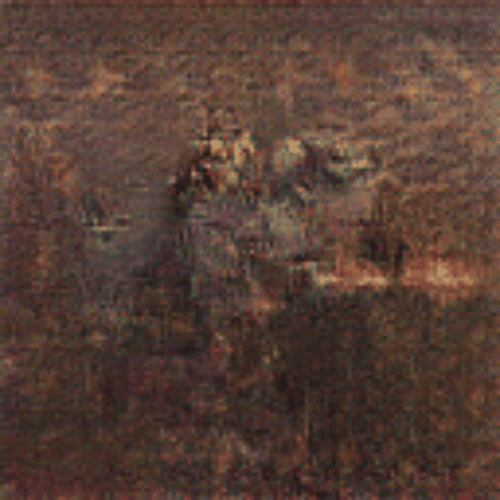

In [47]:
#dict_keys(['amusement', 'anger', 'awe', 'contentment', 'disgust', 'excitement', 'fear', 'sadness'])

fake_images *= 255.0
converted_images = fake_images.astype(np.uint8)
converted_images = tf.image.resize(converted_images, (500, 500)).numpy().astype(np.uint8)
imageio.mimsave("animation.gif", converted_images, fps=0.5)
embed.embed_file("animation.gif")

# Plot 20 images of each class
# Increase size SRGAN 1024x1024 -> 512x512
# Style transfer -> Chosing the style, colors, art of a gan plus style mood

In [ ]:
trained_gen.save("generator_proto.h5")